In [29]:
from tqdm import tqdm
import numpy as np
import os
import librosa
import matplotlib.pyplot as plt
from IPython.display import Audio, display
import torch
input_dir = "./Speech"

In [13]:
sample_rate = 23040

In [14]:
output_folder = os.path.join(input_dir, 'Phase')
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

In [15]:
wav_files = [f for f in os.listdir(input_dir) if f.endswith('.wav')]

In [16]:
wav_files = sorted(wav_files)
len(wav_files)

67

In [17]:
wav_files[4]

'005_Neutral_4_x_1_0.wav'

In [18]:
file_path = os.path.normpath(os.path.join(input_dir, wav_files[4]))

display(Audio(file_path, autoplay=False))

In [19]:
y, sr = librosa.load(file_path, sr=sample_rate)
np.shape(y)

(3389952,)

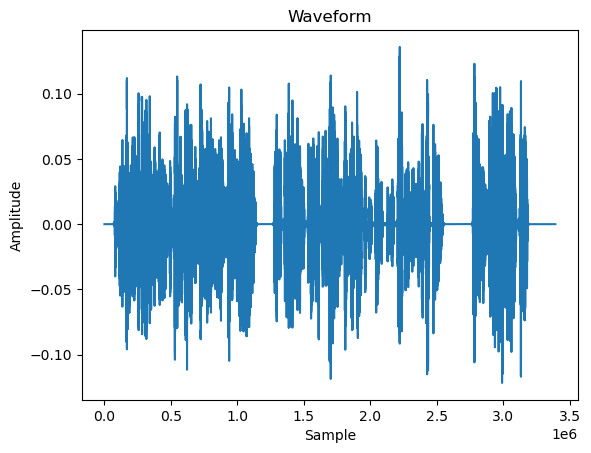

In [20]:
plt.plot(y)
plt.title("Waveform")
plt.xlabel("Sample")
plt.ylabel("Amplitude")
plt.show()

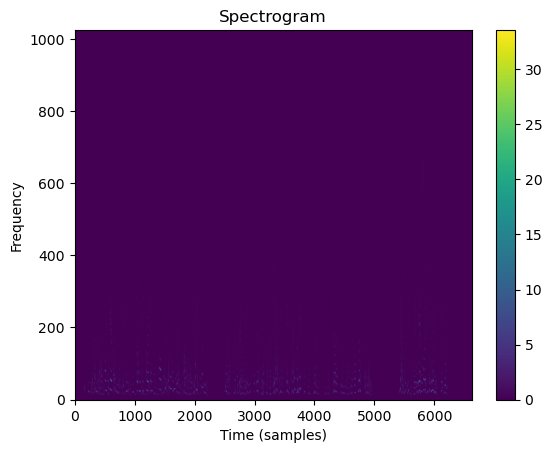

In [22]:
spectrogram = librosa.stft(y)
spectrogram = np.abs(spectrogram)

plt.imshow(spectrogram, origin='lower', aspect='auto')
plt.title("Spectrogram")
plt.xlabel("Time (samples)")
plt.ylabel("Frequency")
plt.colorbar()
plt.show()

In [23]:
np.shape(spectrogram)

(1025, 6622)

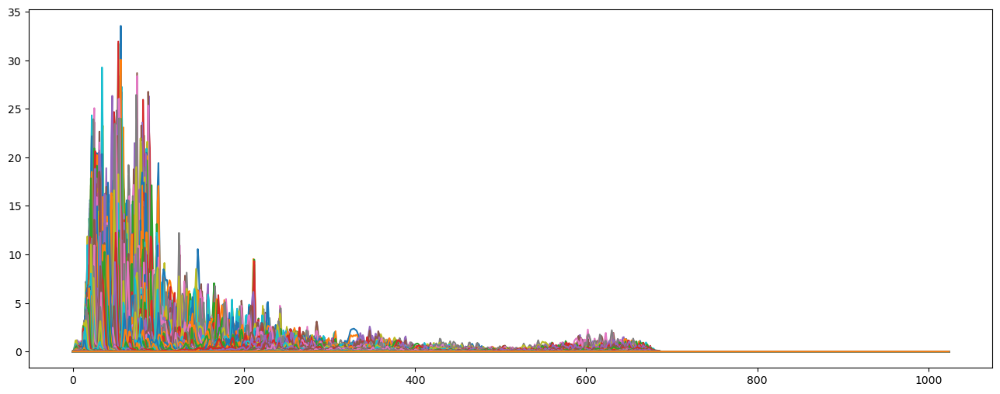

In [24]:
plt.figure(figsize = (16, 6))
plt.plot(spectrogram)

In [25]:
len(y)

3389952

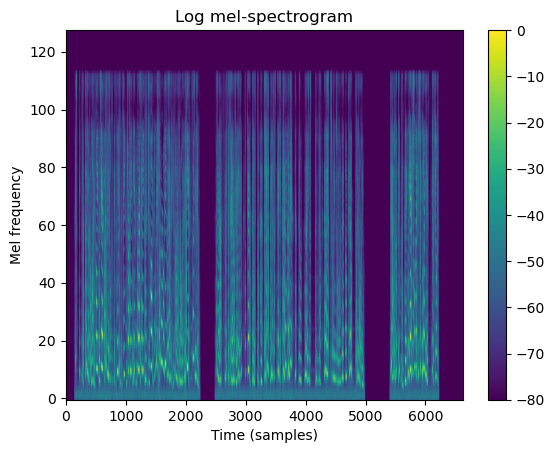

In [32]:
mel_spectrogram = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128)
log_mel_spectrogram = librosa.power_to_db(mel_spectrogram, ref=np.max)

plt.imshow(log_mel_spectrogram, origin='lower', aspect='auto')
plt.title("Log mel-spectrogram")
plt.xlabel("Time (samples)")
plt.ylabel("Mel frequency")
plt.colorbar()
plt.show()


In [27]:
print(np.shape(log_mel_spectrogram))
print(np.shape(mel_spectrogram))

(128, 6622)
(128, 6622)


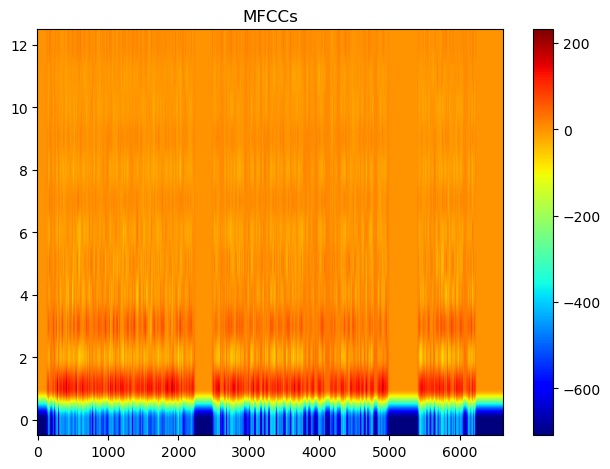

In [28]:
# mel_spectrogram = librosa.feature.melspectrogram(y, sr=sr)
mel_spectrogram = librosa.feature.melspectrogram(y=y, sr=sr)

log_mel_spectrogram = librosa.power_to_db(mel_spectrogram)
mfccs = librosa.feature.mfcc(S=log_mel_spectrogram, n_mfcc=13)

plt.imshow(mfccs, origin='lower', aspect='auto', cmap='jet')
plt.colorbar()
plt.title('MFCCs')
plt.tight_layout()
plt.show()

In [ ]:
np.shape(y)

In [ ]:
rfft = torch.fft.rfft(function, dim=dim)
magnitudes = rfft.abs()
spectrum = magnitudes[:, :, 1:]  # Spectrum without DC component
power = spectrum ** 2

# Frequency
freq = torch.sum(self.freqs * power, dim=dim) / torch.sum(power, dim=dim)

# Amplitude
amp = 2 * torch.sqrt(torch.sum(power, dim=dim)) / self.time_range

# Offset
offset = rfft.real[:, :, 0] / self.time_range  # DC component

return freq, amp, offset

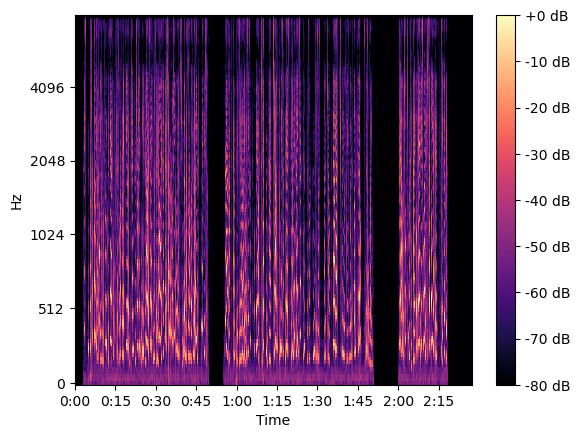

In [35]:
S = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128, fmax=8000)
fig, ax = plt.subplots()
S_dB = librosa.power_to_db(S, ref=np.max)

img = librosa.display.specshow(S_dB, x_axis='time', y_axis='mel', sr=sr, fmax=8000, ax=ax)

fig.colorbar(img, ax=ax, format='%+2.0f dB')

In [30]:
rfft = np.fft.rfft(y)

NameError: name 'dim' is not defined

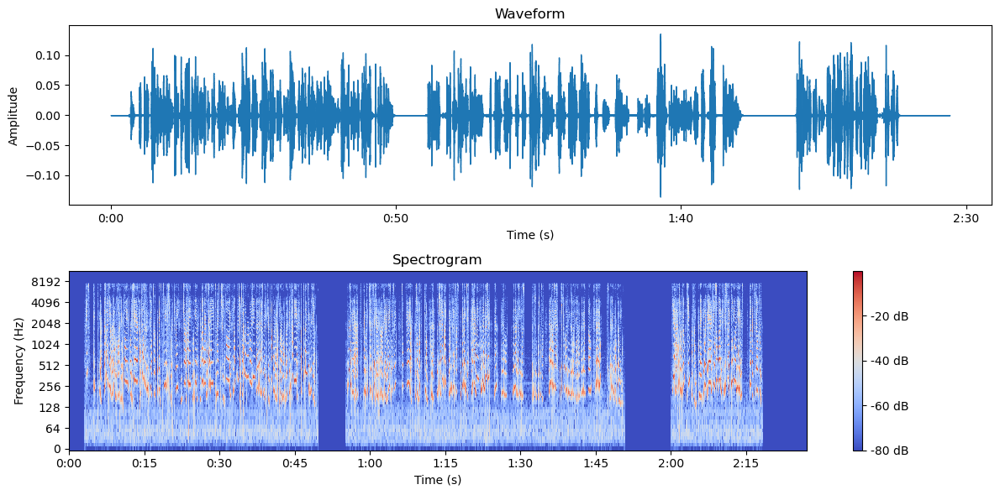

In [85]:
# Plot the waveform
plt.figure(figsize=(12, 6))

plt.subplot(2, 1, 1)
librosa.display.waveshow(y, sr=sr)
plt.title('Waveform')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')

# Plot the spectrogram
plt.subplot(2, 1, 2)
D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='log', cmap='coolwarm')
plt.title('Spectrogram')
plt.colorbar(format='%+2.0f dB')
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')

# Show the plots
plt.tight_layout()
plt.show()

In [40]:
window = 2.0
fps = 60
frames = int(window * fps) + 1
gather_padding = (int((frames - 1) / 2))
gather_window = np.arange(frames) - gather_padding
timestamp_window = gather_window/fps
timestamp_window

array([-1.        , -0.98333333, -0.96666667, -0.95      , -0.93333333,
       -0.91666667, -0.9       , -0.88333333, -0.86666667, -0.85      ,
       -0.83333333, -0.81666667, -0.8       , -0.78333333, -0.76666667,
       -0.75      , -0.73333333, -0.71666667, -0.7       , -0.68333333,
       -0.66666667, -0.65      , -0.63333333, -0.61666667, -0.6       ,
       -0.58333333, -0.56666667, -0.55      , -0.53333333, -0.51666667,
       -0.5       , -0.48333333, -0.46666667, -0.45      , -0.43333333,
       -0.41666667, -0.4       , -0.38333333, -0.36666667, -0.35      ,
       -0.33333333, -0.31666667, -0.3       , -0.28333333, -0.26666667,
       -0.25      , -0.23333333, -0.21666667, -0.2       , -0.18333333,
       -0.16666667, -0.15      , -0.13333333, -0.11666667, -0.1       ,
       -0.08333333, -0.06666667, -0.05      , -0.03333333, -0.01666667,
        0.        ,  0.01666667,  0.03333333,  0.05      ,  0.06666667,
        0.08333333,  0.1       ,  0.11666667,  0.13333333,  0.15

In [43]:
len(timestamp_window)

121

In [45]:
len(y)/sr

147.13333333333333

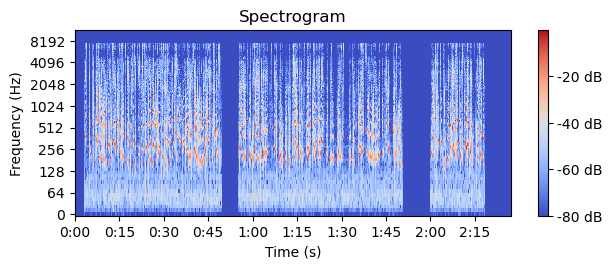

In [50]:
plt.subplot(2, 1, 2)
D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='log', cmap='coolwarm')
plt.title('Spectrogram')
plt.colorbar(format='%+2.0f dB')
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')

# Show the plots
plt.tight_layout()
plt.show()

In [93]:
3389952/sr/2

73.56666666666666

In [95]:
print(np.shape(y))
segment_final = y[sr*73:sr*75]
len(segment_final)

(3389952,)


46080

In [102]:
mfccs_final = librosa.feature.mfcc(y=segment_final, sr=sr, n_mfcc=13)
np.shape(mfccs_final)

(13, 91)

In [78]:
mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)
np.shape(mfccs)

(13, 6622)

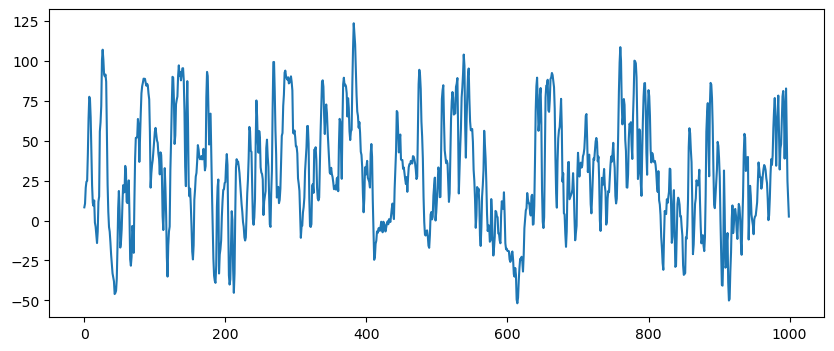

In [77]:
# Compute MFCCs from the audio file


# Plot the MFCCs
plt.figure(figsize=(10, 4))
plt.plot(mfccs[3][1000:2000])
plt.show()
# librosa.display.specshow(mfccs, sr=sr, x_axis='time')
# plt.colorbar()
# plt.title('MFCC')
# plt.tight_layout()
plt.show()

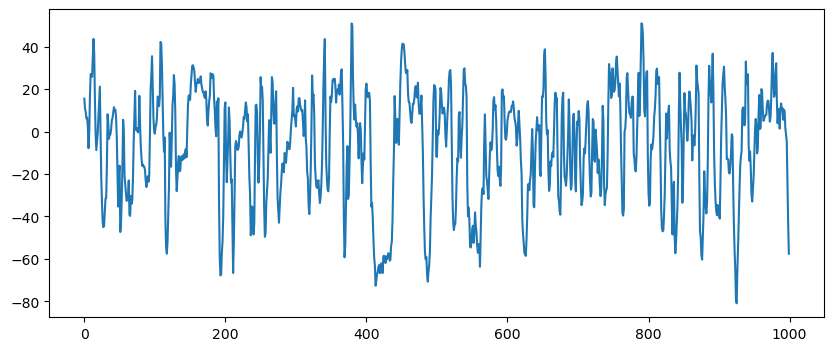

In [68]:
plt.figure(figsize=(10, 4))
plt.plot(mfccs[4][1000:2000])
plt.show()

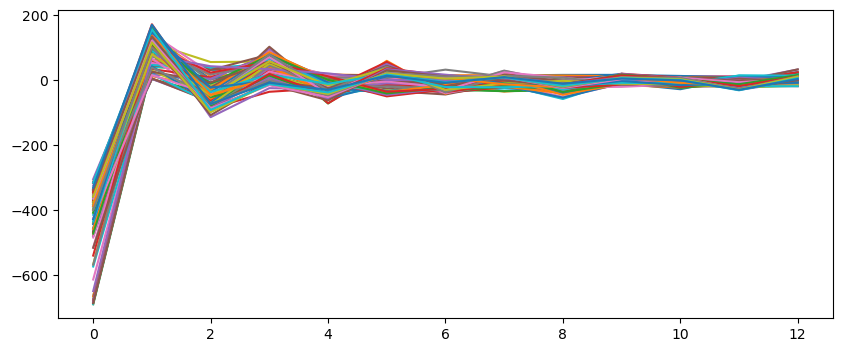

In [103]:
plt.figure(figsize=(10, 4))
plt.plot(mfccs_final)
plt.show()

In [105]:
np.shape(mfccs_final)

(13, 91)

/var/folders/jp/rdbm5vdn37d4r9b4jfc_k23m0000gn/T/ipykernel_7547/1497414859.py:7: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


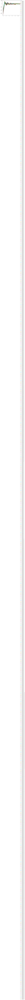

In [106]:
plt.figure()
for i in range(13):
    plt.plot(mfccs_final, label=f'Series {i+1}')
plt.legend(loc='upper right', bbox_to_anchor=(1.15, 1.0))

# Display the plot
plt.tight_layout()
plt.show()

In [ ]:
# mfcc_new = sig2s2mfc_energy(y, None)

In [82]:
obj = MFCC(frate=60)
mfcc = obj.sig2s2mfc_energy(y, None)

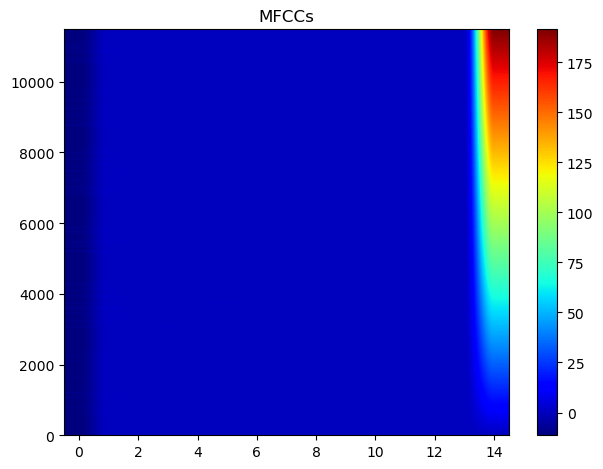

In [83]:
plt.imshow(mfcc, origin='lower', aspect='auto', cmap='jet')
plt.colorbar()
plt.title('MFCCs')
plt.tight_layout()
plt.show()

In [85]:
len(y)

3061248

In [126]:

mfccreader = MyMFCC(frate=20.0, samprate=16000)

# mfccreader.sig2s2mfc_energy(y, None)

In [2]:
import numpy, numpy.fft
import math
import librosa
import os


def mel(f):
    return 2595. * numpy.log10(1. + f / 700.)


def melinv(m):
    return 700. * (numpy.power(10., m / 2595.) - 1.)


class MFCC(object):
    def __init__(self, nfilt=40, ncep=13,
                 lowerf=133.3333, upperf=6855.4976, alpha=0.97,
                 samprate=16000, frate=100, wlen=0.0256,
                 nfft=512):
        # Store parameters
        self.samprate = samprate
        self.lowerf = lowerf
        self.upperf = upperf
        self.nfft = nfft
        self.ncep = ncep
        self.nfilt = nfilt
        self.frate = frate
        self.fshift = float(samprate) / frate

        # Build Hamming window
        self.wlen = int(wlen * samprate)
        self.win = numpy.hamming(self.wlen)

        # Prior sample for pre-emphasis
        self.prior = 0
        self.alpha = alpha

        # Build mel filter matrix
        self.filters = numpy.zeros((nfft // 2 + 1, nfilt), 'd')
        dfreq = float(samprate) / nfft
        if upperf > samprate / 2:
            raise (Exception,
                   "Upper frequency %f exceeds Nyquist %f" % (upperf, samprate / 2))
        melmax = mel(upperf)
        melmin = mel(lowerf)
        dmelbw = (melmax - melmin) / (nfilt + 1)
        # Filter edges, in Hz
        filt_edge = melinv(melmin + dmelbw * numpy.arange(nfilt + 2, dtype='d'))

        for whichfilt in range(0, nfilt):
            # Filter triangles, in DFT points
            leftfr = round(filt_edge[whichfilt] / dfreq)
            centerfr = round(filt_edge[whichfilt + 1] / dfreq)
            rightfr = round(filt_edge[whichfilt + 2] / dfreq)
            # For some reason this is calculated in Hz, though I think
            # it doesn't really matter
            fwidth = (rightfr - leftfr) * dfreq
            height = 2. / fwidth

            if centerfr != leftfr:
                leftslope = height / (centerfr - leftfr)
            else:
                leftslope = 0
            freq = leftfr + 1
            while freq < centerfr:
                self.filters[freq, whichfilt] = (freq - leftfr) * leftslope
                freq = freq + 1
            if freq == centerfr:  # This is always true
                self.filters[freq, whichfilt] = height
                freq = freq + 1
            if centerfr != rightfr:
                rightslope = height / (centerfr - rightfr)
            while freq < rightfr:
                self.filters[freq, whichfilt] = (freq - rightfr) * rightslope
                freq = freq + 1
        #             print("Filter %d: left %d=%f center %d=%f right %d=%f width %d" %
        #                   (whichfilt,
        #                   leftfr, leftfr*dfreq,
        #                   centerfr, centerfr*dfreq,
        #                   rightfr, rightfr*dfreq,
        #                   freq - leftfr))
        #             print self.filters[leftfr:rightfr,whichfilt]

        # Build DCT matrix
        self.s2dct = s2dctmat(nfilt, ncep, 1. / nfilt)
        self.dct = dctmat(nfilt, ncep, numpy.pi / nfilt)

    def sig2s2mfc(self, sig):
        nfr = int(len(sig) / self.fshift + 1)
        mfcc = numpy.zeros((nfr, self.ncep), 'd')
        fr = 0
        while fr < nfr:
            start = round(fr * self.fshift)
            end = min(len(sig), start + self.wlen)
            frame = sig[start:end]
            if len(frame) < self.wlen:
                frame = numpy.resize(frame, self.wlen)
                frame[self.wlen:] = 0
            mfcc[fr] = self.frame2s2mfc(frame)
            fr = fr + 1
        return mfcc

    def sig2logspec(self, sig):
        nfr = int(len(sig) / self.fshift + 1)
        mfcc = numpy.zeros((nfr, self.nfilt), 'd')
        fr = 0
        while fr < nfr:
            start = round(fr * self.fshift)
            end = min(len(sig), start + self.wlen)
            frame = sig[start:end]
            if len(frame) < self.wlen:
                frame = numpy.resize(frame, self.wlen)
                frame[self.wlen:] = 0
            mfcc[fr] = self.frame2logspec(frame)
            fr = fr + 1
        return mfcc

    def pre_emphasis(self, frame):
        # FIXME: Do this with matrix multiplication
        outfr = numpy.empty(len(frame), 'd')
        outfr[0] = frame[0] - self.alpha * self.prior
        for i in range(1, len(frame)):
            outfr[i] = frame[i] - self.alpha * frame[i - 1]
        self.prior = frame[-1]
        return outfr

    def frame2logspec(self, frame):
        frame = self.pre_emphasis(frame) * self.win
        fft = numpy.fft.rfft(frame, self.nfft)
        # Square of absolute value
        power = fft.real * fft.real + fft.imag * fft.imag
        return numpy.log(numpy.dot(power, self.filters).clip(1e-5, numpy.inf))

    def frame2s2mfc(self, frame):
        logspec = self.frame2logspec(frame)
        return numpy.dot(logspec, self.s2dct.T) / self.nfilt

    def sig2s2mfc_energy(self, sig, dn):
        nfr = int(len(sig) / self.fshift + 1)

        mfcc = numpy.zeros((nfr, self.ncep + 2), 'd')
        fr = 0
        while fr < nfr:
            start = int(round(fr * self.fshift))
            end = min(len(sig), start + self.wlen)
            frame = sig[start:end]
            if len(frame) < self.wlen:
                frame = numpy.resize(frame, self.wlen)
                frame[self.wlen:] = 0
            mfcc[fr, :-2] = self.frame2s2mfc(frame)
            mfcc[fr, -2] = math.log(1 + numpy.mean(numpy.power(frame.astype(float), 2)))
            mid = 0.5 * (start + end - 1)
            mfcc[fr, -1] = mid / self.samprate

            fr = fr + 1
        return mfcc


def s2dctmat(nfilt, ncep, freqstep):
    """Return the 'legacy' not-quite-DCT matrix used by Sphinx"""
    melcos = numpy.empty((ncep, nfilt), 'double')
    for i in range(0, ncep):
        freq = numpy.pi * float(i) / nfilt
        melcos[i] = numpy.cos(freq * numpy.arange(0.5, float(nfilt) + 0.5, 1.0, 'double'))
    melcos[:, 0] = melcos[:, 0] * 0.5
    return melcos


def logspec2s2mfc(logspec, ncep=13):
    """Convert log-power-spectrum bins to MFCC using the 'legacy'
    Sphinx transform"""
    nframes, nfilt = logspec.shape
    melcos = s2dctmat(nfilt, ncep, 1. / nfilt)
    return numpy.dot(logspec, melcos.T) / nfilt


def dctmat(N, K, freqstep, orthogonalize=True):
    """Return the orthogonal DCT-II/DCT-III matrix of size NxK.
    For computing or inverting MFCCs, N is the number of
    log-power-spectrum bins while K is the number of cepstra."""
    cosmat = numpy.zeros((N, K), 'double')
    for n in range(0, N):
        for k in range(0, K):
            cosmat[n, k] = numpy.cos(freqstep * (n + 0.5) * k)
    if orthogonalize:
        cosmat[:, 0] = cosmat[:, 0] * 1. / numpy.sqrt(2)
    return cosmat


def dct(input, K=13):
    """Convert log-power-spectrum to MFCC using the orthogonal DCT-II"""
    nframes, N = input.shape
    freqstep = numpy.pi / N
    cosmat = dctmat(N, K, freqstep)
    return numpy.dot(input, cosmat) * numpy.sqrt(2.0 / N)


def dct2(input, K=13):
    """Convert log-power-spectrum to MFCC using the normalized DCT-II"""
    nframes, N = input.shape
    freqstep = numpy.pi / N
    cosmat = dctmat(N, K, freqstep, False)
    return numpy.dot(input, cosmat) * (2.0 / N)


def idct(input, K=40):
    """Convert MFCC to log-power-spectrum using the orthogonal DCT-III"""
    nframes, N = input.shape
    freqstep = numpy.pi / K
    cosmat = dctmat(K, N, freqstep).T
    return numpy.dot(input, cosmat) * numpy.sqrt(2.0 / K)


def dct3(input, K=40):
    """Convert MFCC to log-power-spectrum using the unnormalized DCT-III"""
    nframes, N = input.shape
    freqstep = numpy.pi / K
    cosmat = dctmat(K, N, freqstep, False)
    cosmat[:, 0] = cosmat[:, 0] * 0.5
    return numpy.dot(input, cosmat.T)


In [4]:
wav_path = "./Speech/001_Neutral_0_x_1_0.wav"

wav, fs = librosa.load(wav_path, sr=16000)

In [6]:
obj = MFCC(frate=20) 

mfcc = obj.sig2s2mfc_energy(wav, None)

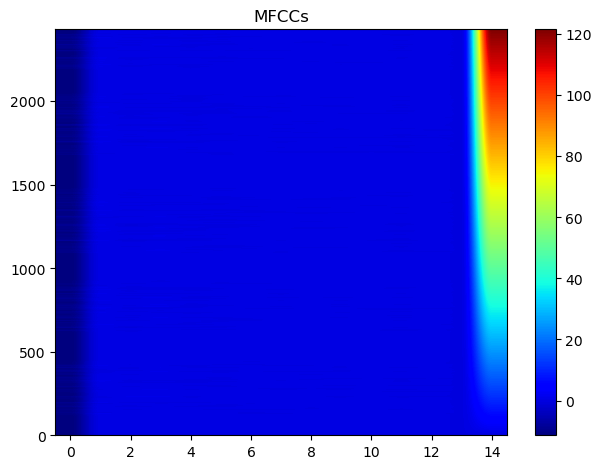

In [10]:
plt.imshow(mfcc, origin='lower', aspect='auto', cmap='jet')
plt.colorbar()
plt.title('MFCCs')
plt.tight_layout()
plt.show()

In [12]:
np.shape(mfcc)

(2429, 15)